In [1]:
ROOT_DIR = "/home/bigboy/Krispin/projects/Metaworld"
%env MUJOCO_GL=egl

import sys
sys.path.append(ROOT_DIR)

import os
import functools
import json
from tqdm import tqdm
import importlib
from dataclasses import dataclass

# scientific
import cv2
import numpy as np
import torch
import pytorch_lightning as pl

# gym
# from gym.spaces import Box
import mujoco
import metaworld
from metaworld import MT1

# plotting
from PIL import Image
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from lightglue import viz2d

# project imports
# from metaworld.envs.mujoco.sawyer_xyz.test_scripted_policies import ALL_ENVS, test_cases_latest_nonoise
# import reset_space
import utils.camera_utils_v2 as cu
import keyframes.env_utils as env_utils
import keyframes.env_renderer as env_renderer
import keyframes.mujoco_utils as mujoco_utils
import keyframes.keyframe_utils as keyframe_utils
import keyframes.pl_modules as pl_modules
import utils.predict_utils as keyframe_predict

import utils.slam_utils as slam_utils
import utils.depth_utils as depth_utils
import utils.match_utils as match_utils
import utils.transform_utils as transform_utils
import utils.inference_utils as inference_utils

import models.extern.mcc_model as mcc_model
import utils.mcc_misc_utils as mcc_misc_utils
import utils.mcc_data_utils as mcc_data_utils
import utils.predict_utils as predict_utils
import utils.vis_utils as vis_utils
import utils.plotly_utils as plotly_utils
import utils.torch_utils as torch_utils

from pytorch3d.io.obj_io import load_obj

import keyframes.grasp_pose as grasp_pose
import keyframes.policies.expert_policy_utils as expert_policy_utils
import keyframes.policies.pick_place_policy as pick_place_policy

DEVICE = "cuda"


env: MUJOCO_GL=egl


In [2]:
importlib.reload(keyframe_utils)

<module 'keyframes.keyframe_utils' from '/home/bigboy/Krispin/projects/Metaworld/keyframes/keyframe_utils.py'>

In [3]:
# model cktps
model_ckpts_dir = "/home/bigboy/Krispin/model_ckpts"
fts_match_ckpt_path = f"{model_ckpts_dir}/lightglue_epoch=34-step=3885.ckpt"
seg_any_ckpt_path = f"{model_ckpts_dir}/sam_vit_h_4b8939.pth"
mcc_ckpt_path = f"{model_ckpts_dir}/co3dv2_all_categories.pth"

# load models

# load feature extractor
model_fts_extract = slam_utils.get_super_glue_extractor(device=DEVICE)

# load feature matching model
config = inference_utils.load_config("feature_matching", "01", ROOT_DIR=ROOT_DIR)
model_fts_match = pl_modules.PLModel(config["model_args"], config["optimizer_args"])
model_fts_match = model_fts_match.load_from_checkpoint(fts_match_ckpt_path)
model_fts_match.to(DEVICE)
model_fts_match.eval()

# grasp pose
grasp_pose_estimator = grasp_pose.GraspPoseEstimatorMCC(
    seg_any_ckpt_path=seg_any_ckpt_path,
    mcc_ckpt_path=mcc_ckpt_path,
    device=DEVICE,
    log=True,
)

Loading SegAny segmentor...
Loading MCC reconstructor...
Resume checkpoint /home/bigboy/Krispin/model_ckpts/co3dv2_all_categories.pth
_IncompatibleKeys(missing_keys=[], unexpected_keys=['mask_token'])


In [4]:
for i in range(len(env_utils.env_names)):
    print(f"{i}: {env_utils.env_names[i]}")

0: assembly-v2
1: basketball-v2
2: bin-picking-v2
3: box-close-v2
4: button-press-topdown-v2
5: button-press-topdown-wall-v2
6: button-press-v2
7: button-press-wall-v2
8: coffee-button-v2
9: coffee-pull-v2
10: coffee-push-v2
11: dial-turn-v2
12: disassemble-v2
13: door-close-v2
14: door-lock-v2
15: door-open-v2
16: door-unlock-v2
17: hand-insert-v2
18: drawer-close-v2
19: drawer-open-v2
20: faucet-open-v2
21: faucet-close-v2
22: hammer-v2
23: handle-press-side-v2
24: handle-press-v2
25: handle-pull-side-v2
26: handle-pull-v2
27: lever-pull-v2
28: peg-insert-side-v2
29: pick-place-wall-v2
30: pick-out-of-hole-v2
31: reach-v2
32: push-back-v2
33: push-v2
34: pick-place-v2
35: plate-slide-v2
36: plate-slide-side-v2
37: plate-slide-back-v2
38: plate-slide-back-side-v2
39: peg-unplug-side-v2
40: soccer-v2
41: stick-push-v2
42: stick-pull-v2
43: push-wall-v2
44: reach-wall-v2
45: shelf-place-v2
46: sweep-into-v2
47: sweep-v2
48: window-open-v2
49: window-close-v2


In [9]:
importlib.reload(keyframe_utils)

<module 'keyframes.keyframe_utils' from '/home/bigboy/Krispin/projects/Metaworld/keyframes/keyframe_utils.py'>

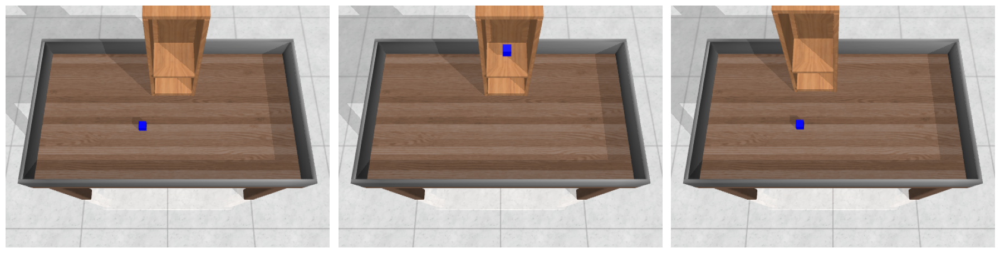

In [161]:
# reference keyframes env

# param
env_index = 45
img_height, img_width = 360, 480

# generate env and renderer
env, expert_policy, renderer = env_utils.generate_env_and_renderer(env_index, height=img_height, width=img_width, camera_name="keyframes")
T_world2pixel = cu.get_camera_transform_matrix(env, "keyframes", img_height, img_width)
T_pixel2world = np.linalg.inv(T_world2pixel)


# generate keyframes
keyframe_data = keyframe_utils.generate_keyframes(env, renderer)

img_ref_0 = keyframe_data["img"][0]
img_ref_1 = keyframe_data["img"][1]
depth_ref_0 = keyframe_data["depth"][0]
depth_ref_1 = keyframe_data["depth"][1]

# generate keyframe of current env
img_cur, depth_cur = keyframe_utils.generate_cur_keyframe(env, renderer)

viz2d.plot_images([img_ref_0, img_ref_1, img_cur])

In [138]:
importlib.reload(inference_utils)

<module 'utils.inference_utils' from '/home/bigboy/Krispin/projects/Metaworld/utils/inference_utils.py'>

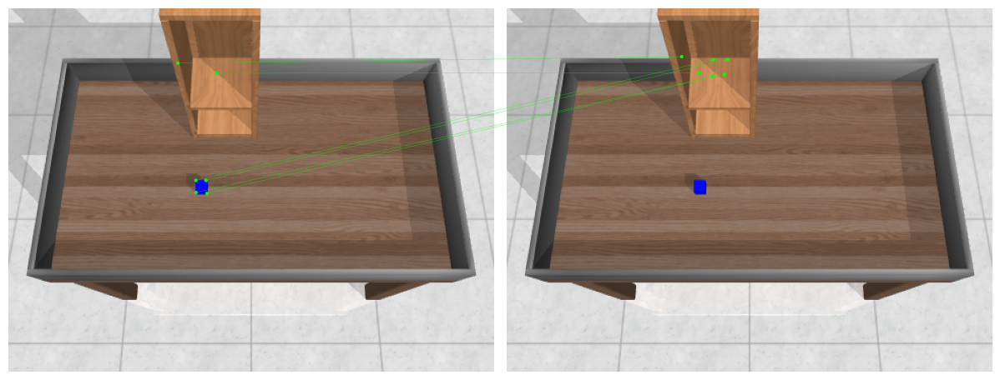

In [162]:
ref_data = inference_utils.compute_matches(model_fts_extract, model_fts_match, img_ref_0, img_ref_1, depth_ref_0, depth_ref_1, T_pixel2world)
pred_res = inference_utils.predict_feature_movement_from_ref_data(model_fts_extract, model_fts_match, T_world2pixel, img_cur, depth_cur, ref_data)
inference_utils.show_matches_kpts(img_cur, img_cur, pred_res["kpts"]["kpts_2_0"], pred_res["kpts"]["kpts_2_1"])

In [142]:
def visualize_keypoint_matches_0(img_0, img_1, kpts_0, kpts_1, matches_0):
    kpts_0 = kpts_0[matches_0 != -1]
    kpts_1 = kpts_1[matches_0[matches_0 != -1]]
    inference_utils.show_matches_kpts(img_0, img_1, kpts_0, kpts_1) 


def visualize_keypoint_mapping(img_0, img_1, kpts_0, kpts_1, kpts_m):
    matches = -np.ones(kpts_0.shape[0], dtype=int)
    matches[kpts_m[:, 0]] = kpts_m[:, 1]
    visualize_keypoint_matches_0(img_0, img_1, kpts_0, kpts_1, matches)

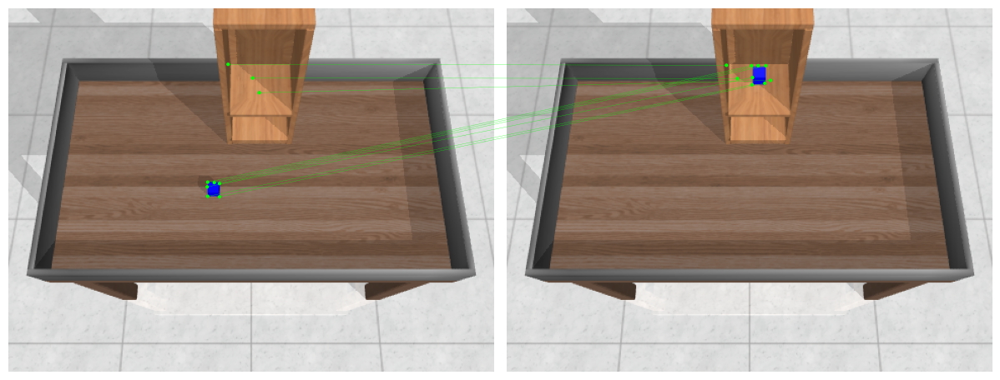

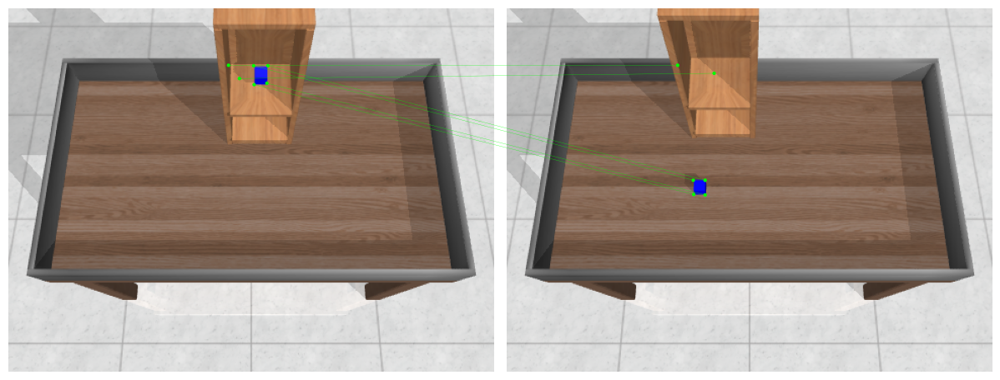

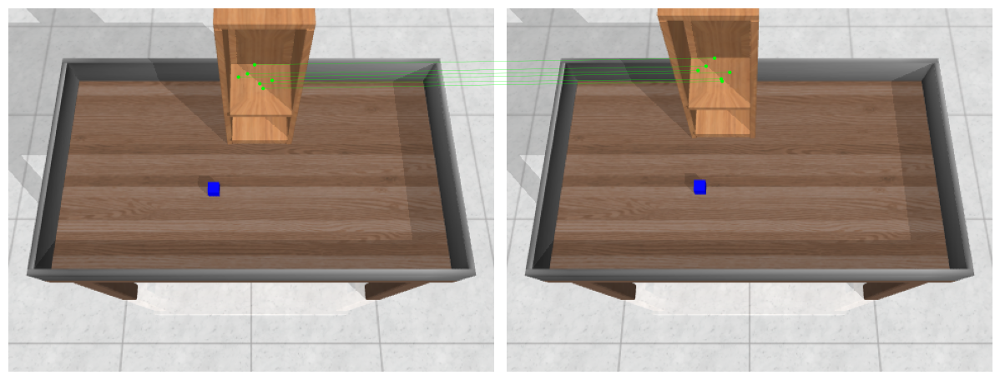

In [163]:
visualize_keypoint_mapping(img_ref_0, img_ref_1, ref_data["kpts_0"], ref_data["kpts_1"], pred_res["debug"]["m_moving_0_0_to_0_1"])
visualize_keypoint_mapping(img_ref_1, img_cur, ref_data["kpts_1"], pred_res["debug"]["kpts_cur"], pred_res["debug"]["m_moving_0_1_to_1_1"])
visualize_keypoint_mapping(img_ref_0, img_cur, ref_data["kpts_0"], pred_res["debug"]["kpts_cur"], pred_res["debug"]["m_closest_1_0_to_1_1"])

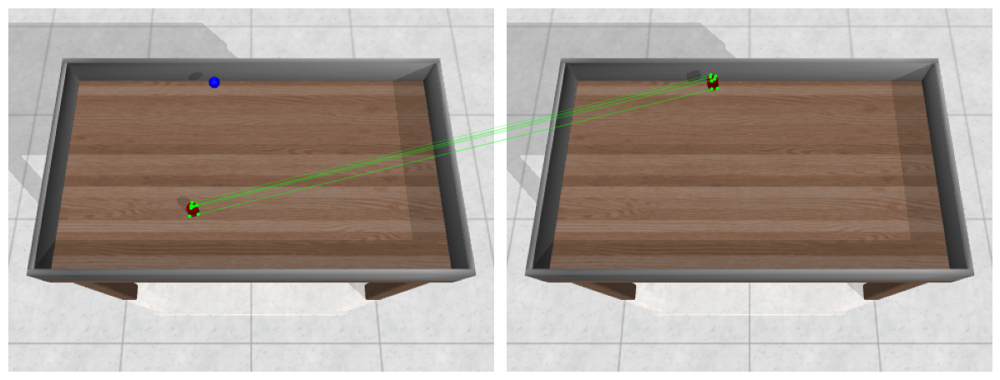

In [104]:
m_ref = m_moving_0 # ref_data["match_data_0"].matches_0
inference_utils.show_matches_kpts(img_ref_0, img_ref_1, ref_data["match_data_0"].keypoints_0[m_ref != -1], ref_data["match_data_0"].keypoints_1[m_ref[m_ref != -1]])

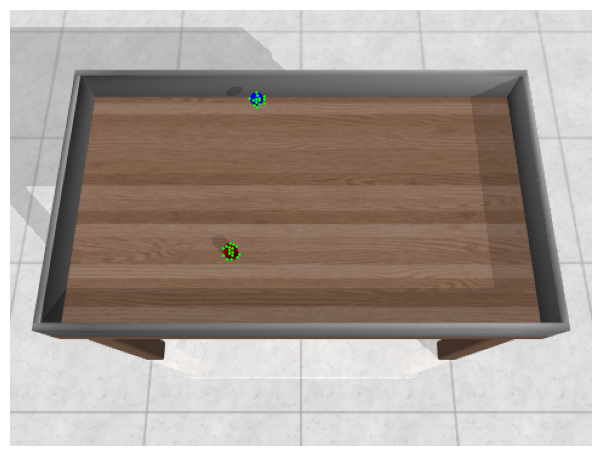

In [109]:
axes = viz2d.plot_images([img_ref_0])
viz2d.plot_keypoints([ref_data["kpts_ref_0"]])

In [41]:
ref_data.keys()

dict_keys(['img_ref_0', 'img_ref_1', 'depth_ref_0', 'depth_ref_1', 'kpts_ref_0', 'kpts_ref_1', 'kpts_ref_0_wpos', 'kpts_ref_1_wpos', 'desc_ref_0', 'desc_ref_1', 'kpts_scores_ref_0', 'kpts_scores_ref_1', 'match_data_0'])

In [9]:
xyz = depth_utils.pixel_coords_to_world_coords(
    T_pixel2world, 
    depth_cur,
)[:,:3]
grasp_point_res = grasp_pose_estimator.predict_grasp_point(img_cur, xyz, pred_res["kpts"]["kpts_2_0"], mcc_params={"grid_granularity": 0.025})
R_closest, t_closest, t_no_rot_closest, x_center, moving_fts_inter_frame_transform = predict_utils.compute_T(
    pred_res["kpts"]["wpos_kpts_2_0"], 
    pred_res["kpts"]["wpos_kpts_2_1"]
)
grasp_point = grasp_point_res["grasp_point"] + np.array([0, 0, 0.05])
target_point = moving_fts_inter_frame_transform(grasp_point)
policy = pick_place_policy.PickPlacePolicy(grasp_point, target_point)

Computing mask...
Computing MCC...


100%|██████████| 256/256 [01:04<00:00,  3.97it/s]


torch.Size([487, 3])


100%|██████████| 1/1 [00:00<00:00, 10.19it/s]


Generating potential grasp points...


100%|██████████| 2/2 [00:00<00:00,  3.69it/s]

Selecting grasp points closes to center of moving object...


In [10]:
plotly_utils.plot_mesh(grasp_point_res["verts"], grasp_point_res["faces"])

In [11]:
plotly_utils.plot_scatter([xyz, np.vstack([grasp_point, target_point]), pred_res["kpts"]["wpos_kpts_2_0"], pred_res["kpts"]["wpos_kpts_2_1"]], sizes=[2, 6, 2, 2], colors=["grey", "green", "red", "blue"])

In [ ]:
def go_to_beginning(env, policy, n_steps=10):
    for _ in range(n_steps):
        policy.step(env)

In [157]:
env.go_to_step(0)

In [153]:
env.curr_path_length = 0

done True 1
[0.0775627  0.80739131 0.15237267]


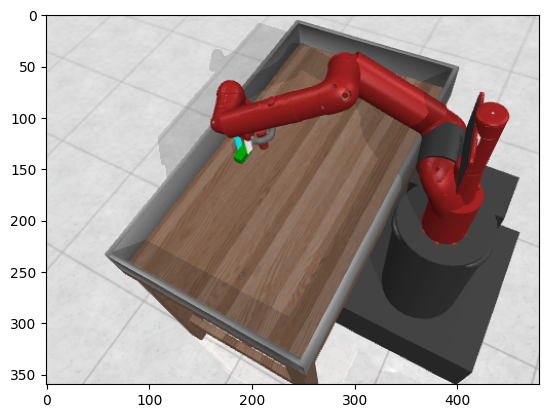

In [23]:
o = env_utils.go_forward(env, agent = policy, n_steps=20)["o"];
print(o[:3])
plt.imshow(cv2.flip(renderer.render(camera_name="corner3")["img"], 0))

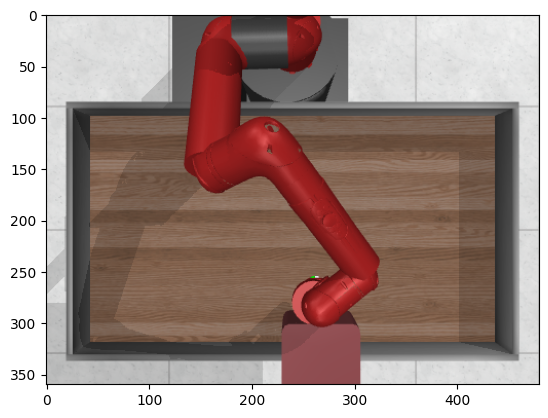

In [259]:
plt.imshow(cv2.flip(renderer.render(camera_name="topview")["img"], 0))